In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel(r'C:\Users\SANIKA\Documents\Bias_correction.xlsx')

In [3]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaT,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
df.shape

(7752, 25)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

In [8]:
df.nunique()

station               25
Date                 310
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7672
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7675
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7569
LDAPS_CC2           7582
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            183
Next_Tmin            157
dtype: int64

In [9]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [10]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


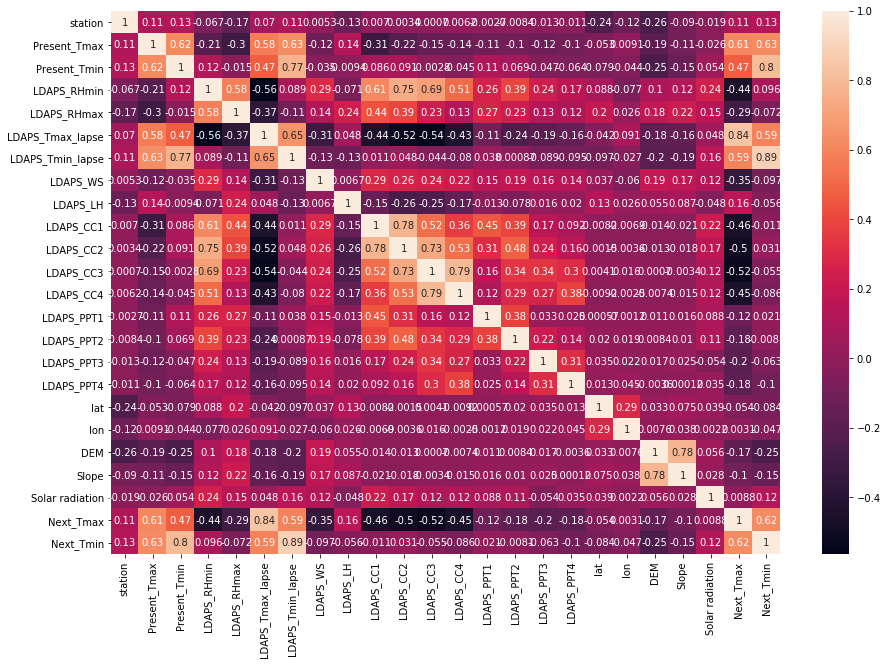

In [11]:
plt.figure(figsize=(15,10))
df_cor=df.corr()
sns.heatmap(df_cor,annot=True)

In [12]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

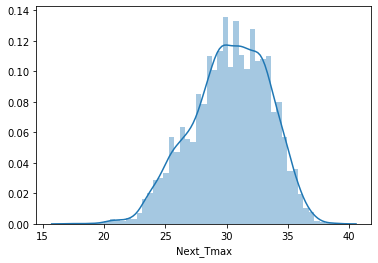

In [13]:
sns.distplot(df['Next_Tmax'])

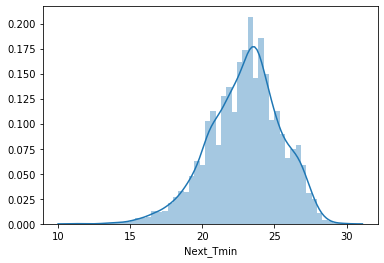

In [14]:
sns.distplot(df['Next_Tmin'])

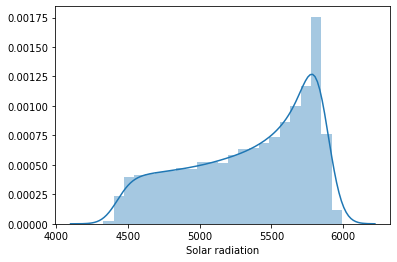

In [15]:
sns.distplot(df['Solar radiation'])

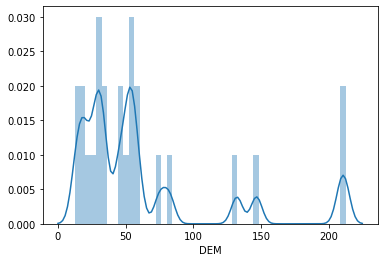

In [16]:
sns.distplot(df['DEM'])

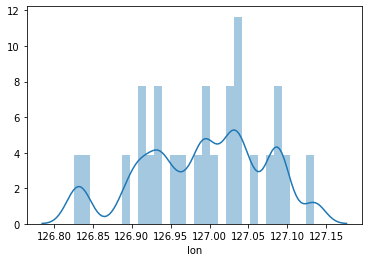

In [17]:
sns.distplot(df['lon'])

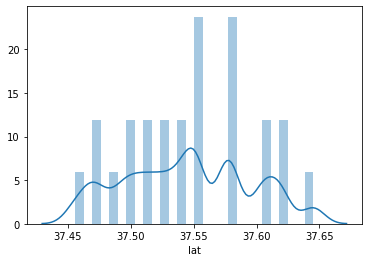

In [18]:
sns.distplot(df['lat'])

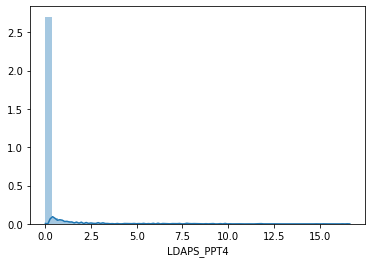

In [19]:
sns.distplot(df['LDAPS_PPT4'])

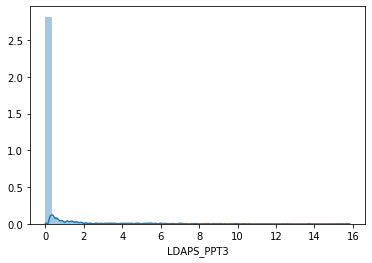

In [20]:
sns.distplot(df['LDAPS_PPT3'])

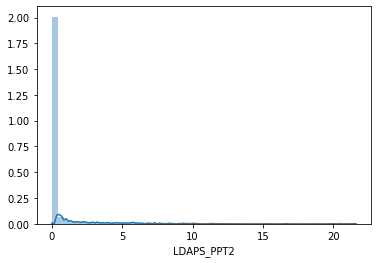

In [21]:
sns.distplot(df['LDAPS_PPT2'])

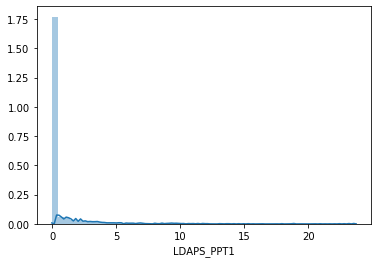

In [22]:
sns.distplot(df['LDAPS_PPT1'])

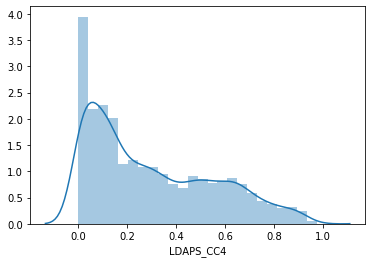

In [23]:
sns.distplot(df['LDAPS_CC4'])

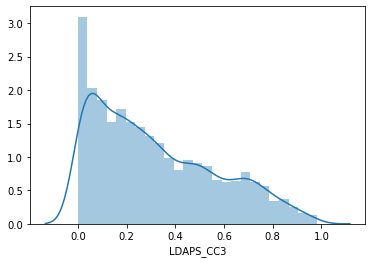

In [24]:
sns.distplot(df['LDAPS_CC3'])

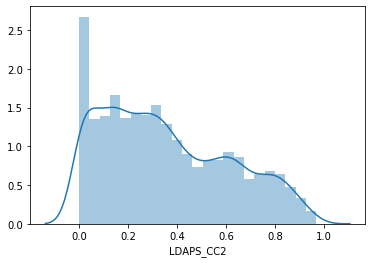

In [25]:
sns.distplot(df['LDAPS_CC2'])

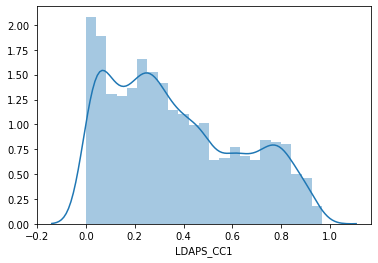

In [26]:
sns.distplot(df['LDAPS_CC1'])

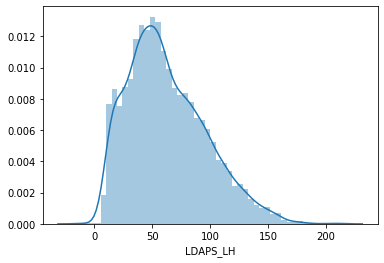

In [27]:
sns.distplot(df['LDAPS_LH'])

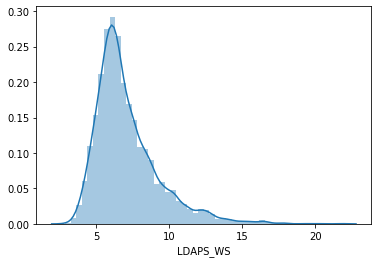

In [28]:
sns.distplot(df['LDAPS_WS'])

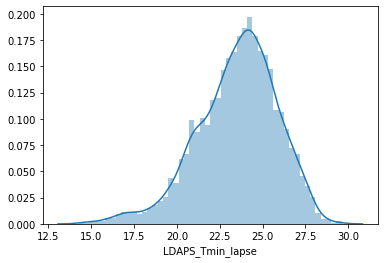

In [29]:
sns.distplot(df['LDAPS_Tmin_lapse'])

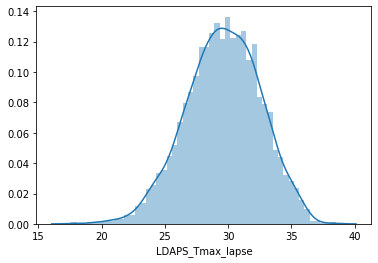

In [30]:
sns.distplot(df['LDAPS_Tmax_lapse'])

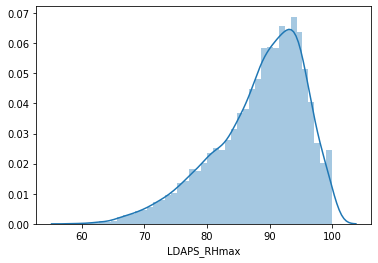

In [31]:
sns.distplot(df['LDAPS_RHmax'])

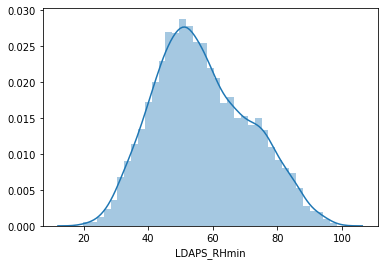

In [32]:
sns.distplot(df['LDAPS_RHmin'])

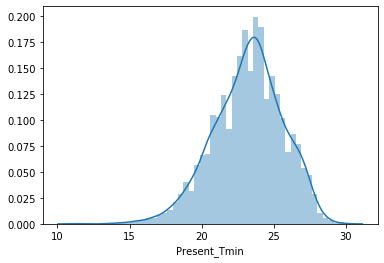

In [33]:
sns.distplot(df['Present_Tmin'])

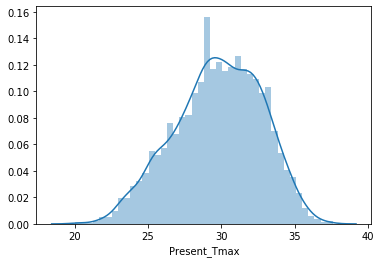

In [34]:
sns.distplot(df['Present_Tmax'])

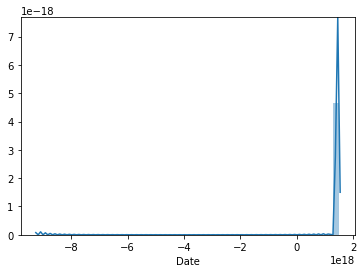

In [35]:
sns.distplot(df['Date'])

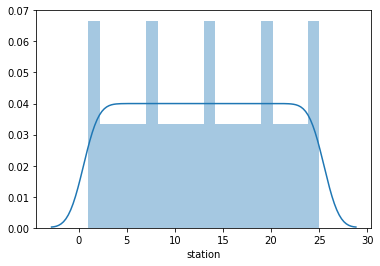

In [36]:
sns.distplot(df['station'])

station                AxesSubplot(0.125,0.749828;0.110714x0.130172)
Present_Tmax        AxesSubplot(0.257857,0.749828;0.110714x0.130172)
Present_Tmin        AxesSubplot(0.390714,0.749828;0.110714x0.130172)
LDAPS_RHmin         AxesSubplot(0.523571,0.749828;0.110714x0.130172)
LDAPS_RHmax         AxesSubplot(0.656429,0.749828;0.110714x0.130172)
LDAPS_Tmax_lapse    AxesSubplot(0.789286,0.749828;0.110714x0.130172)
LDAPS_Tmin_lapse       AxesSubplot(0.125,0.593621;0.110714x0.130172)
LDAPS_WS            AxesSubplot(0.257857,0.593621;0.110714x0.130172)
LDAPS_LH            AxesSubplot(0.390714,0.593621;0.110714x0.130172)
LDAPS_CC1           AxesSubplot(0.523571,0.593621;0.110714x0.130172)
LDAPS_CC2           AxesSubplot(0.656429,0.593621;0.110714x0.130172)
LDAPS_CC3           AxesSubplot(0.789286,0.593621;0.110714x0.130172)
LDAPS_CC4              AxesSubplot(0.125,0.437414;0.110714x0.130172)
LDAPS_PPT1          AxesSubplot(0.257857,0.437414;0.110714x0.130172)
LDAPS_PPT2          AxesSubplot(0.

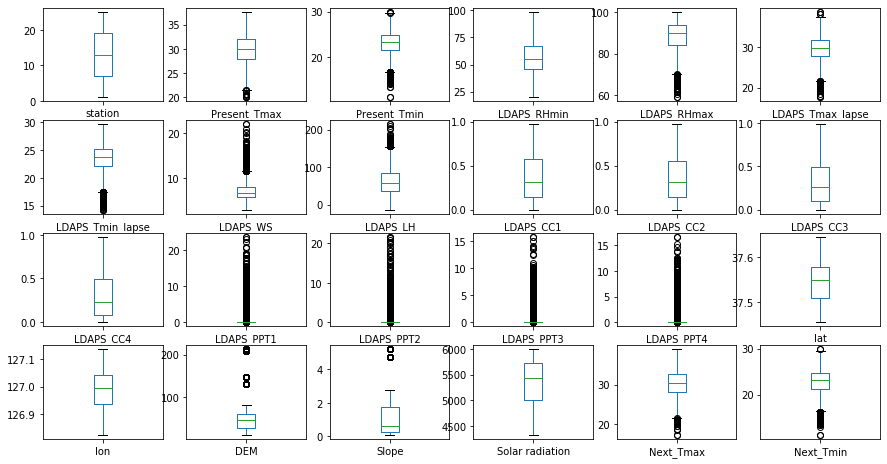

In [37]:
df.plot(kind='box',subplots = True,layout=(5,6),figsize = (15,10))

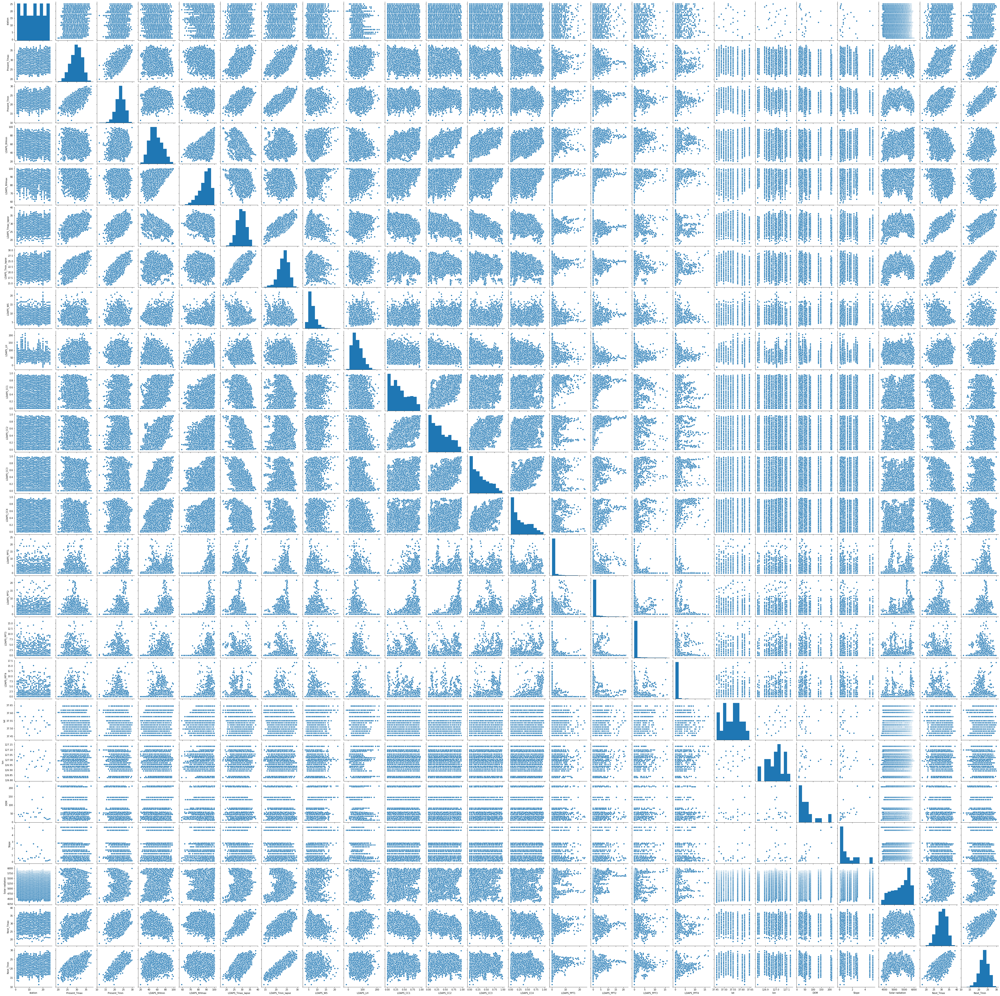

In [4]:
sns.pairplot(df)

In [39]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [5]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [6]:
df['Day']=pd.to_datetime(df['Date'],format='%Y-%d-%m').dt.day

In [7]:
df['Month']=pd.to_datetime(df['Date'],format='%Y-%d-%m').dt.month

In [8]:
df['Year']=pd.to_datetime(df['Date'],format='%Y-%d-%m').dt.year

In [9]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
Day                        float64
Month                      float64
Year                       float64
dtype: object

In [10]:
df.drop(['Date'],inplace=True,axis=1)

In [11]:
def myfillna(series):
    if series.dtype is pd.np.dtype(float):
        return series.fillna(0)
    else:
        return series

In [12]:
df = df.apply(myfillna)

In [13]:
df.tail()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1,30.0,8.0,2017.0
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8,30.0,8.0,2017.0
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4,30.0,8.0,2017.0
7750,0.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3,0.0,0.0,0.0
7751,0.0,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8,0.0,0.0,0.0


In [14]:
df = df.astype({"Day":'int', "Month":'int',"Year":"int"})  

In [15]:
df.tail()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1,30,8,2017
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8,30,8,2017
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4,30,8,2017
7750,0.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3,0,0,0
7751,0.0,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8,0,0,0


In [16]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

In [17]:
df.skew()

station             -0.000115
Present_Tmax        -3.402987
Present_Tmin        -3.232442
LDAPS_RHmin         -0.113889
LDAPS_RHmax         -4.712138
LDAPS_Tmax_lapse    -3.457452
LDAPS_Tmin_lapse    -3.573353
LDAPS_WS             1.163684
LDAPS_LH             0.635208
LDAPS_CC1            0.460727
LDAPS_CC2            0.474379
LDAPS_CC3            0.643064
LDAPS_CC4            0.671739
LDAPS_PPT1           5.395178
LDAPS_PPT2           5.776835
LDAPS_PPT3           6.458608
LDAPS_PPT4           6.826930
lat                  0.087062
lon                 -0.285213
DEM                  1.723257
Slope                1.563020
Solar radiation     -0.511210
Next_Tmax           -2.213759
Next_Tmin           -2.049088
Day                 -0.009012
Month               -0.840039
Year               -62.067548
dtype: float64

In [18]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year'],
      dtype='object')

In [19]:
skew=['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year']
for col in skew:
    if df.skew().loc[col]>0.55:
        df[col]=np.log1p(df[col])

In [20]:
df.skew()

station             -0.000115
Present_Tmax        -3.402987
Present_Tmin        -3.232442
LDAPS_RHmin         -0.113889
LDAPS_RHmax         -4.712138
LDAPS_Tmax_lapse    -3.457452
LDAPS_Tmin_lapse    -3.573353
LDAPS_WS            -2.199811
LDAPS_LH            -1.868882
LDAPS_CC1            0.460727
LDAPS_CC2            0.474379
LDAPS_CC3            0.390746
LDAPS_CC4            0.449621
LDAPS_PPT1           2.766149
LDAPS_PPT2           3.195810
LDAPS_PPT3           4.014298
LDAPS_PPT4           4.230575
lat                  0.087062
lon                 -0.285213
DEM                  0.443730
Slope                0.836131
Solar radiation     -0.511210
Next_Tmax           -2.213759
Next_Tmin           -2.049088
Day                 -0.009012
Month               -0.840039
Year               -62.067548
dtype: float64

In [21]:
skew=['LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
for col in skew:
    if df.skew().loc[col]>0.55:
        df[col]=np.log1p(df[col])

In [22]:
df.skew()

station             -0.000115
Present_Tmax        -3.402987
Present_Tmin        -3.232442
LDAPS_RHmin         -0.113889
LDAPS_RHmax         -4.712138
LDAPS_Tmax_lapse    -3.457452
LDAPS_Tmin_lapse    -3.573353
LDAPS_WS            -2.199811
LDAPS_LH            -1.868882
LDAPS_CC1            0.460727
LDAPS_CC2            0.474379
LDAPS_CC3            0.390746
LDAPS_CC4            0.449621
LDAPS_PPT1           2.230632
LDAPS_PPT2           2.650049
LDAPS_PPT3           3.301381
LDAPS_PPT4           3.467666
lat                  0.087062
lon                 -0.285213
DEM                  0.443730
Slope                0.836131
Solar radiation     -0.511210
Next_Tmax           -2.213759
Next_Tmin           -2.049088
Day                 -0.009012
Month               -0.840039
Year               -62.067548
dtype: float64

In [23]:
from scipy.stats import zscore
zscore=abs(zscore(df))
print(df)

      station  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
0         1.0          28.7          21.4    58.255688    91.116364   
1         2.0          31.9          21.6    52.263397    90.604721   
2         3.0          31.6          23.3    48.690479    83.973587   
3         4.0          32.0          23.4    58.239788    96.483688   
4         5.0          31.4          21.9    56.174095    90.155128   
...       ...           ...           ...          ...          ...   
7747     23.0          23.3          17.1    26.741310    78.869858   
7748     24.0          23.3          17.7    24.040634    77.294975   
7749     25.0          23.2          17.4    22.933014    77.243744   
7750      0.0          20.0          11.3    19.794666    58.936283   
7751      0.0          37.6          29.9    98.524734   100.000153   

      LDAPS_Tmax_lapse  LDAPS_Tmin_lapse  LDAPS_WS  LDAPS_LH  LDAPS_CC1  ...  \
0            28.074101         23.006936  2.056542  4.254929   0.23

In [24]:
#outliers are removed
df_new=df.loc[(zscore<3).all(axis=1)]
print(df_new.shape)

(0, 27)


In [25]:
df.shape

(7752, 27)

In [26]:
y=df['Next_Tmax'].values

In [27]:
#independent varaibles
x= df[[i for i in list(df.columns) if i not in ["Next_Tmax","Next_Tmin"]]]

In [28]:
x.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.233947,...,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,30,6,2013
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.225508,...,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,30,6,2013
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.209344,...,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,30,6,2013
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.216372,...,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,30,6,2013
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.151407,...,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,30,6,2013


In [29]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            4
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

In [30]:
df['LDAPS_LH'].fillna(0,inplace=True)

In [31]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

In [32]:
np.where(np.isnan(x))

(array([4769, 6244, 6269, 7750], dtype=int64),
 array([8, 8, 8, 8], dtype=int64))

In [33]:
pd.DataFrame(x).fillna(0,inplace=True)

In [34]:
from sklearn.preprocessing import OrdinalEncoder
# Encoding
enc = OrdinalEncoder()
x= enc.fit_transform(x)

In [35]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x =sc.fit_transform(x)

In [36]:
x

array([[-1.663153  , -0.32022941, -0.68300855, ...,  1.57166882,
        -2.75922005, -1.41302864],
       [-1.52451817,  0.71920045, -0.60462456, ...,  1.57166882,
        -2.75922005, -1.41302864],
       [-1.38588334,  0.6217539 ,  0.06163943, ...,  1.57166882,
        -2.75922005, -1.41302864],
       ...,
       [ 1.66408295, -2.10674948, -2.25068852, ...,  1.57166882,
         1.00222791,  1.41412274],
       [-1.80178783, -2.91880406, -3.54402449, ..., -1.79132792,
        -4.63994404, -2.11981649],
       [-1.80178783,  2.47323834,  2.49154337, ..., -1.79132792,
        -4.63994404, -2.11981649]])

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn import linear_model
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train, x_test, y_train, y_test = train_test_split(x,y,random_state=r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print('r2_score corresponding to random state:',r_state,'is',r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state

    print('max r2 score corresponding to',final_r_state,'is:',max_r_score)
    return final_r_state

In [72]:
#lets use Linear Regression and check max_r2_score
from sklearn.linear_model import LinearRegression
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state: 42 is 0.6227084712961016
r2_score corresponding to random state: 43 is 0.5747075080899311
r2_score corresponding to random state: 44 is 0.6004330016207818
r2_score corresponding to random state: 45 is 0.6364466913451094
r2_score corresponding to random state: 46 is 0.4925684319075053
r2_score corresponding to random state: 47 is 0.5890448462192408
r2_score corresponding to random state: 48 is 0.6364567203396717
r2_score corresponding to random state: 49 is 0.5353734436791764
r2_score corresponding to random state: 50 is 0.6293993763652739
r2_score corresponding to random state: 51 is 0.6041169005255749
r2_score corresponding to random state: 52 is 0.5891226750161429
r2_score corresponding to random state: 53 is 0.5228235634204894
r2_score corresponding to random state: 54 is 0.6000232990013408
r2_score corresponding to random state: 55 is 0.6239690632183132
r2_score corresponding to random state: 56 is 0.5958861827042783
r2_score corresponding to

In [73]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neighbors={'n_neighbors':range(1,30)}
knr=KNeighborsRegressor()
gknr=GridSearchCV(knr,neighbors,cv=10)
gknr.fit(x,y)
gknr.best_params_

{'n_neighbors': 29}

In [74]:
#lets use KNN regression and check max r2 score
knr=KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knr,x,y)

r2_score corresponding to random state: 42 is 0.6872475771723865
r2_score corresponding to random state: 43 is 0.6178914573352376
r2_score corresponding to random state: 44 is 0.6615025984403823
r2_score corresponding to random state: 45 is 0.7269283897382801
r2_score corresponding to random state: 46 is 0.5331697862712449
r2_score corresponding to random state: 47 is 0.6716692853542681
r2_score corresponding to random state: 48 is 0.7077587765410414
r2_score corresponding to random state: 49 is 0.5876749629296796
r2_score corresponding to random state: 50 is 0.6951060083123859
r2_score corresponding to random state: 51 is 0.6733498677130083
r2_score corresponding to random state: 52 is 0.6372089233284123
r2_score corresponding to random state: 53 is 0.5835079846959408
r2_score corresponding to random state: 54 is 0.6891901505522277
r2_score corresponding to random state: 55 is 0.7188387528147664
r2_score corresponding to random state: 56 is 0.6746716289885757
r2_score corresponding to

In [75]:
from sklearn.model_selection import cross_val_score
print('Mean r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for Linear Regression: ',cross_val_score(lreg,x,y,cv=5,scoring='r2').std())
print()
print('Mean r2 score for KNN Regression:',cross_val_score(knr,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for KNeighborsRegressor: ',cross_val_score(knr,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for Linear Regression: 0.5042633807021589
standard deviation in r2 score for Linear Regression:  0.10739747953439387

Mean r2 score for KNN Regression: 0.4320214342676677
standard deviation in r2 score for KNeighborsRegressor:  0.11850870316533142



In [76]:
#lets check lasso regression & find alpha
from sklearn.linear_model import Lasso
lsreg=Lasso()
parameters={'alpha':[0.001,0.01,0.1,1]}
clf=GridSearchCV(lsreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 0.1}

In [77]:
#lets check max_r2_score with alpha=0.1
lsreg=Lasso(alpha=0.1)
r_state=maxr2_score(lsreg,x,y)

r2_score corresponding to random state: 42 is 0.6075188703336278
r2_score corresponding to random state: 43 is 0.5682810172356272
r2_score corresponding to random state: 44 is 0.5925363589424777
r2_score corresponding to random state: 45 is 0.6407934031833908
r2_score corresponding to random state: 46 is 0.4868198340569374
r2_score corresponding to random state: 47 is 0.5817086669513869
r2_score corresponding to random state: 48 is 0.6338148067282525
r2_score corresponding to random state: 49 is 0.5275137190928032
r2_score corresponding to random state: 50 is 0.6244288552903422
r2_score corresponding to random state: 51 is 0.5938553313121776
r2_score corresponding to random state: 52 is 0.5797456993853496
r2_score corresponding to random state: 53 is 0.53217226432831
r2_score corresponding to random state: 54 is 0.6121995452958903
r2_score corresponding to random state: 55 is 0.6178152062084807
r2_score corresponding to random state: 56 is 0.6072845146676452
r2_score corresponding to r

In [78]:
print('Mean r2 score for Lasso Regression:',cross_val_score(lsreg,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for Lasso Regression: ',cross_val_score(lsreg,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for Lasso Regression: 0.5218070200232685
standard deviation in r2 score for Lasso Regression:  0.09689647052977549



In [79]:
#Now we will try to boost by GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import warnings
warnings.filterwarnings('ignore')
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[10,100,500,1000]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.01, 'n_estimators': 500}

In [80]:
gbr=GradientBoostingRegressor(learning_rate=0.01 ,n_estimators=500 )
print('Mean r2 score for GradientBoostingRegressor:',cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for GradientBoostingRegressor: ',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for GradientBoostingRegressor: 0.5435033804281254
standard deviation in r2 score for GradientBoostingRegressor:  0.12642932915987637



In [81]:
gbr=GradientBoostingRegressor(learning_rate=0.01, n_estimators=500)
r_state=maxr2_score(gbr,x,y)

r2_score corresponding to random state: 42 is 0.6786484255915135
r2_score corresponding to random state: 43 is 0.6101309869476683
r2_score corresponding to random state: 44 is 0.6273657994300595
r2_score corresponding to random state: 45 is 0.7039499265985018
r2_score corresponding to random state: 46 is 0.5428082086256738
r2_score corresponding to random state: 47 is 0.6479922389375766
r2_score corresponding to random state: 48 is 0.687610125888781
r2_score corresponding to random state: 49 is 0.5755849838220273
r2_score corresponding to random state: 50 is 0.6904329336262109
r2_score corresponding to random state: 51 is 0.636168419227318
r2_score corresponding to random state: 52 is 0.6196237127229142
r2_score corresponding to random state: 53 is 0.5752617011650315
r2_score corresponding to random state: 54 is 0.6711382277369541
r2_score corresponding to random state: 55 is 0.6938686058188525
r2_score corresponding to random state: 56 is 0.6596320165319334
r2_score corresponding to r

In [82]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import warnings
warnings.filterwarnings('ignore')
ada_reg=AdaBoostRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[10,100,500,1000],
            'base_estimator':[lreg,lsreg,DecisionTreeRegressor()]}
clf=GridSearchCV(ada_reg,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'base_estimator': DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best'),
 'learning_rate': 1,
 'n_estimators': 1000}

In [83]:
ada_reg=AdaBoostRegressor(base_estimator= DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best'),
 learning_rate= 1,
 n_estimators= 1000)
r_state=maxr2_score(ada_reg,x,y)

r2_score corresponding to random state: 42 is 0.7706536943759321
r2_score corresponding to random state: 43 is 0.6814274690366076
r2_score corresponding to random state: 44 is 0.7397853741858984
r2_score corresponding to random state: 45 is 0.8157876402294729
r2_score corresponding to random state: 46 is 0.5443339003268968
r2_score corresponding to random state: 47 is 0.7169307910721341
r2_score corresponding to random state: 48 is 0.7313037777073721
r2_score corresponding to random state: 49 is 0.6569788816716222
r2_score corresponding to random state: 50 is 0.7373348741175285
r2_score corresponding to random state: 51 is 0.7636264771702693
r2_score corresponding to random state: 52 is 0.6954050640937677
r2_score corresponding to random state: 53 is 0.6538749722014752
r2_score corresponding to random state: 54 is 0.7818437462594654
r2_score corresponding to random state: 55 is 0.7854422675950851
r2_score corresponding to random state: 56 is 0.747860841113127
r2_score corresponding to 

In [84]:
ada_reg=AdaBoostRegressor(base_estimator= DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best'),
 learning_rate= 0.1,
 n_estimators= 1000)
print('Mean r2 score for AdaBoostRegressor:',cross_val_score(ada_reg,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for AdaBoostRegressor: ',cross_val_score(ada_reg,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for AdaBoostRegressor: 0.52856890930197
standard deviation in r2 score for AdaBoostRegressor:  0.12908935486651557



In [85]:
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')
rf=RandomForestRegressor()
parameters = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000] }
clf= GridSearchCV(rf,parameters,cv = 3, n_jobs = -1, verbose = 2)
clf.fit(x,y)
clf.best_params_  

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed: 34.0min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 43.2min finished


{'bootstrap': True,
 'max_depth': 80,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 10,
 'n_estimators': 200}

In [86]:
rf=RandomForestRegressor(bootstrap= True,
 max_depth=80,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 10,
 n_estimators= 200)
r_state=maxr2_score(rf,x,y)

r2_score corresponding to random state: 42 is 0.7514392627289153
r2_score corresponding to random state: 43 is 0.6675816350854866
r2_score corresponding to random state: 44 is 0.718188289317182
r2_score corresponding to random state: 45 is 0.7940230167983946
r2_score corresponding to random state: 46 is 0.5945443553099417
r2_score corresponding to random state: 47 is 0.7151337022590152
r2_score corresponding to random state: 48 is 0.7721380204134559
r2_score corresponding to random state: 49 is 0.6414260567903696
r2_score corresponding to random state: 50 is 0.7793069050608881
r2_score corresponding to random state: 51 is 0.7438843114006728
r2_score corresponding to random state: 52 is 0.6839963754947829
r2_score corresponding to random state: 53 is 0.6351398074679027
r2_score corresponding to random state: 54 is 0.7538263387266105
r2_score corresponding to random state: 55 is 0.7747963670095035
r2_score corresponding to random state: 56 is 0.734074085642865
r2_score corresponding to r

In [87]:
rf=RandomForestRegressor(bootstrap= True,
 max_depth=100,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 100)
print('Mean r2 score for RandomForestRegressor:',cross_val_score(rf,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for RandomForestRegressor: ',cross_val_score(rf,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for RandomForestRegressor: 0.5199542974029983
standard deviation in r2 score for RandomForestRegressor:  0.10783128412149429



In [91]:
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')
svr=SVR()
parameters = {
    'C': [1,10, 100],
    "kernel":['poly','rbf','linear'],
    "epsilon":[0.01,0.1,1]
}
clf = GridSearchCV(svr, parameters, cv=3)
clf.fit(x, y)
clf.best_params_

{'C': 1, 'epsilon': 0.1, 'kernel': 'rbf'}

In [95]:
svr=SVR(C= 1, epsilon= 0.1,kernel= 'rbf')
r_state=maxr2_score(rf,x,y)

r2_score corresponding to random state: 42 is 0.7498814834866386
r2_score corresponding to random state: 43 is 0.6673111328805418
r2_score corresponding to random state: 44 is 0.7200551661423772
r2_score corresponding to random state: 45 is 0.7930946325853785
r2_score corresponding to random state: 46 is 0.5945640754862112
r2_score corresponding to random state: 47 is 0.7140645706986105
r2_score corresponding to random state: 48 is 0.7731852609641177
r2_score corresponding to random state: 49 is 0.6409722066257879
r2_score corresponding to random state: 50 is 0.7782237027025237
r2_score corresponding to random state: 51 is 0.7433658626203568
r2_score corresponding to random state: 52 is 0.6879073088581487
r2_score corresponding to random state: 53 is 0.6360515132638935
r2_score corresponding to random state: 54 is 0.7530132762668378
r2_score corresponding to random state: 55 is 0.7753731464126139
r2_score corresponding to random state: 56 is 0.7337410417101373
r2_score corresponding to

In [97]:
svr=SVR(C= 1, epsilon= 0.1,kernel= 'rbf')
print('Mean r2 score for RandomForestRegressor:',cross_val_score(svr,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for RandomForestRegressor: ',cross_val_score(svr,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for RandomForestRegressor: 0.501059581903153
standard deviation in r2 score for RandomForestRegressor:  0.10650607420548329



In [110]:
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings('ignore')
xgb=XGBRegressor()
parameters ={"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] }
clf = GridSearchCV(xgb, parameters, cv=3)
clf.fit(x, y)
clf.best_params_

{'colsample_bytree': 0.5,
 'gamma': 0.3,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 7}

In [112]:
xgb=XGBRegressor(colsample_bytree= 0.5,
 gamma=0.3,
 learning_rate=0.1,
 max_depth= 4,
 min_child_weight= 7)
r_state=maxr2_score(xgb,x,y)

r2_score corresponding to random state: 42 is 0.7327242898501956
r2_score corresponding to random state: 43 is 0.6559364082589889
r2_score corresponding to random state: 44 is 0.7271283355418849
r2_score corresponding to random state: 45 is 0.8000609076238749
r2_score corresponding to random state: 46 is 0.6134995101864906
r2_score corresponding to random state: 47 is 0.7410445192398619
r2_score corresponding to random state: 48 is 0.7341684423333883
r2_score corresponding to random state: 49 is 0.6656421327901707
r2_score corresponding to random state: 50 is 0.7595322519297651
r2_score corresponding to random state: 51 is 0.7269416637931498
r2_score corresponding to random state: 52 is 0.6856385480742989
r2_score corresponding to random state: 53 is 0.6262729139671175
r2_score corresponding to random state: 54 is 0.7581982751838806
r2_score corresponding to random state: 55 is 0.761225970993361
r2_score corresponding to random state: 56 is 0.7453824455324014
r2_score corresponding to 

In [114]:
xgb==XGBRegressor(colsample_bytree= 0.5,
 gamma=0.3,
 learning_rate=0.1,
 max_depth= 4,
 min_child_weight= 7)
print('Mean r2 score for XGBRegressor:',cross_val_score(xgb,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for XGBRegressor: ',cross_val_score(xgb,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for XGBRegressor: 0.5773291583566073
standard deviation in r2 score for XGBRegressor:  0.0919427168970611



In [44]:
#We tried all the models and till now the best is XGBRegressor
from xgboost import XGBRegressor
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state =71 ,test_size = 0.20)
xgb=XGBRegressor(colsample_bytree= 0.5,
 gamma=0.3,
 learning_rate=0.1,
 max_depth= 4,
 min_child_weight= 7)
xgb.fit(x_train, y_train)
y_pred=xgb.predict(x_test)

In [45]:
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('r2 score is:',r2_score(y_test, y_pred))

RMSE: 0.8839905251266983
r2 score is: 0.8763172103135366


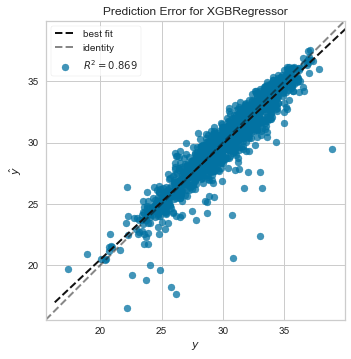

In [78]:
from yellowbrick.regressor import PredictionError
model = XGBRegressor()
visualizer = PredictionError(model)

visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

# Now,Predicting next day Tmin

In [38]:
y=df['Next_Tmin'].values

In [39]:
#independent varaibles
x= df[[i for i in list(df.columns) if i not in ["Next_Tmax","Next_Tmin"]]]

In [100]:
#lets use Linear Regression and check max_r2_score
from sklearn.linear_model import LinearRegression
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state: 42 is 0.6203446613778172
r2_score corresponding to random state: 43 is 0.5619215629275965
r2_score corresponding to random state: 44 is 0.6069084984557317
r2_score corresponding to random state: 45 is 0.6403428270850482
r2_score corresponding to random state: 46 is 0.5220037710118035
r2_score corresponding to random state: 47 is 0.6520172163558575
r2_score corresponding to random state: 48 is 0.6447061068820998
r2_score corresponding to random state: 49 is 0.5744075132051526
r2_score corresponding to random state: 50 is 0.6281964803864166
r2_score corresponding to random state: 51 is 0.6025713158714037
r2_score corresponding to random state: 52 is 0.6112963001161995
r2_score corresponding to random state: 53 is 0.5239683344693429
r2_score corresponding to random state: 54 is 0.5787655191223116
r2_score corresponding to random state: 55 is 0.6379723104207711
r2_score corresponding to random state: 56 is 0.657979848322942
r2_score corresponding to 

In [101]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neighbors={'n_neighbors':range(1,30)}
knr=KNeighborsRegressor()
gknr=GridSearchCV(knr,neighbors,cv=10)
gknr.fit(x,y)
gknr.best_params_

{'n_neighbors': 10}

In [102]:
#lets use KNN regression and check max r2 score
knr=KNeighborsRegressor(n_neighbors=10)
r_state=maxr2_score(knr,x,y)

r2_score corresponding to random state: 42 is 0.5264410655551641
r2_score corresponding to random state: 43 is 0.4680404048569864
r2_score corresponding to random state: 44 is 0.5281604259518131
r2_score corresponding to random state: 45 is 0.5727336696805743
r2_score corresponding to random state: 46 is 0.44121663547195933
r2_score corresponding to random state: 47 is 0.5450468430018349
r2_score corresponding to random state: 48 is 0.5295511334945369
r2_score corresponding to random state: 49 is 0.4617138413623464
r2_score corresponding to random state: 50 is 0.5256582078762063
r2_score corresponding to random state: 51 is 0.5277015202194957
r2_score corresponding to random state: 52 is 0.5047457507509314
r2_score corresponding to random state: 53 is 0.4391760480412805
r2_score corresponding to random state: 54 is 0.5232474621791703
r2_score corresponding to random state: 55 is 0.5621444036921043
r2_score corresponding to random state: 56 is 0.5554781568360667
r2_score corresponding t

In [103]:
from sklearn.model_selection import cross_val_score
print('Mean r2 score for Linear Regression:',cross_val_score(lreg,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for Linear Regression: ',cross_val_score(lreg,x,y,cv=5,scoring='r2').std())
print()
print('Mean r2 score for KNN Regression:',cross_val_score(knr,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for KNeighborsRegressor: ',cross_val_score(knr,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for Linear Regression: 0.4252039055126131
standard deviation in r2 score for Linear Regression:  0.12061170449561383

Mean r2 score for KNN Regression: 0.12291787164997399
standard deviation in r2 score for KNeighborsRegressor:  0.23936168872599511



In [104]:
#lets check lasso regression & find alpha
from sklearn.linear_model import Lasso
lsreg=Lasso()
parameters={'alpha':[0.001,0.01,0.1,1]}
clf=GridSearchCV(lsreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 0.1}

In [105]:
#lets check max_r2_score with alpha=0.1
lsreg=Lasso(alpha=0.1)
r_state=maxr2_score(lsreg,x,y)

r2_score corresponding to random state: 42 is 0.5554998723048715
r2_score corresponding to random state: 43 is 0.5182119601097361
r2_score corresponding to random state: 44 is 0.5657468925761543
r2_score corresponding to random state: 45 is 0.5847653886691154
r2_score corresponding to random state: 46 is 0.4691510559000607
r2_score corresponding to random state: 47 is 0.6106609111950192
r2_score corresponding to random state: 48 is 0.6051540769864636
r2_score corresponding to random state: 49 is 0.5449332239549325
r2_score corresponding to random state: 50 is 0.5963628848356215
r2_score corresponding to random state: 51 is 0.5538483538249874
r2_score corresponding to random state: 52 is 0.5740367619241437
r2_score corresponding to random state: 53 is 0.4816141455446259
r2_score corresponding to random state: 54 is 0.5780300340115981
r2_score corresponding to random state: 55 is 0.5924607424781054
r2_score corresponding to random state: 56 is 0.6075657047805244
r2_score corresponding to

In [106]:
print('Mean r2 score for Lasso Regression:',cross_val_score(lsreg,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for Lasso Regression: ',cross_val_score(lsreg,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for Lasso Regression: 0.41899942371764193
standard deviation in r2 score for Lasso Regression:  0.061011490530868635



In [107]:
#Now we will try to boost by GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import warnings
warnings.filterwarnings('ignore')
gbr=GradientBoostingRegressor()
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[10,100,500,1000]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.01, 'n_estimators': 500}

In [108]:
gbr=GradientBoostingRegressor(learning_rate=0.01 ,n_estimators=500 )
print('Mean r2 score for GradientBoostingRegressor:',cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for GradientBoostingRegressor: ',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for GradientBoostingRegressor: 0.5821481493986975
standard deviation in r2 score for GradientBoostingRegressor:  0.0802040273803012



In [109]:
gbr=GradientBoostingRegressor(learning_rate=0.01, n_estimators=500)
r_state=maxr2_score(gbr,x,y)

r2_score corresponding to random state: 42 is 0.6993391743870903
r2_score corresponding to random state: 43 is 0.6264641671440809
r2_score corresponding to random state: 44 is 0.6895054572565091
r2_score corresponding to random state: 45 is 0.7474220143086707
r2_score corresponding to random state: 46 is 0.58459314261934
r2_score corresponding to random state: 47 is 0.7035668192188373
r2_score corresponding to random state: 48 is 0.7267810860201392
r2_score corresponding to random state: 49 is 0.6397522227960503
r2_score corresponding to random state: 50 is 0.7316352612604002
r2_score corresponding to random state: 51 is 0.7011499780555912
r2_score corresponding to random state: 52 is 0.6469690754501637
r2_score corresponding to random state: 53 is 0.5917964227294735
r2_score corresponding to random state: 54 is 0.7343430293762221
r2_score corresponding to random state: 55 is 0.7316043472922353
r2_score corresponding to random state: 56 is 0.7274831725670605
r2_score corresponding to r

In [115]:
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')
rf=RandomForestRegressor()
parameters = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000] }
clf= GridSearchCV(rf,parameters,cv = 3, n_jobs = -1, verbose = 2)
clf.fit(x,y)
clf.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed: 24.1min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed: 42.9min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 59.4min finished


{'bootstrap': True,
 'max_depth': 90,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 200}

In [116]:
rf=RandomForestRegressor(bootstrap= True,
 max_depth=90,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 200)
r_state=maxr2_score(rf,x,y)

r2_score corresponding to random state: 42 is 0.7463581701642052
r2_score corresponding to random state: 43 is 0.6630023026014562
r2_score corresponding to random state: 44 is 0.7351489303510339
r2_score corresponding to random state: 45 is 0.7965241483012675
r2_score corresponding to random state: 46 is 0.6201632950297116
r2_score corresponding to random state: 47 is 0.7508489066136472
r2_score corresponding to random state: 48 is 0.7725829430660722
r2_score corresponding to random state: 49 is 0.6696417643477366
r2_score corresponding to random state: 50 is 0.7711890082397392
r2_score corresponding to random state: 51 is 0.7496055505700772
r2_score corresponding to random state: 52 is 0.6947184495683567
r2_score corresponding to random state: 53 is 0.6224197362751857
r2_score corresponding to random state: 54 is 0.7764440064372214
r2_score corresponding to random state: 55 is 0.7827635415768333
r2_score corresponding to random state: 56 is 0.7575021266832713
r2_score corresponding to

In [118]:
rf=RandomForestRegressor(bootstrap= True,
 max_depth=90,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 200)
print('Mean r2 score for RandomForestRegressor:',cross_val_score(rf,x,y,cv=5,scoring='r2').mean())
print('standard deviation in r2 score for RandomForestRegressor: ',cross_val_score(rf,x,y,cv=5,scoring='r2').std())
print()

Mean r2 score for RandomForestRegressor: 0.5577270327124835
standard deviation in r2 score for RandomForestRegressor:  0.09910146725798377



In [40]:
#We tried all the models and till now the best is GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import warnings
warnings.filterwarnings('ignore')
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state =71 ,test_size = 0.20)
gbr=GradientBoostingRegressor(learning_rate=0.01 ,n_estimators=500 )
gbr.fit(x_train, y_train)
y_pred=gbr.predict(x_test)

In [41]:
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('r2 score is:',r2_score(y_test, y_pred))

RMSE: 0.9929850986225404
r2 score is: 0.8439371569041328


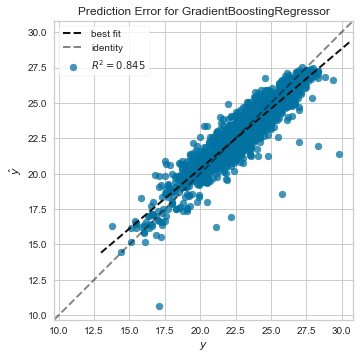

In [42]:
from yellowbrick.regressor import PredictionError
model = GradientBoostingRegressor()
visualizer = PredictionError(model)

visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

In [47]:
from sklearn.externals import joblib
#save the model for Tmin
joblib.dump(gbr, 'Project17.obj')

['Project17.obj']

In [46]:
from sklearn.externals import joblib
#save the model for Tmax
joblib.dump(xgb, 'Project17.obj')

['Project17.obj']